In [3]:
import os
import torch
import random
from torch.utils import data
from torchvision import transforms
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

from unet import UNet
from diffusion import GaussianDiffusion, Trainer, Dataset
# from torch.utils import data

# def cycle(dl):
#     while True:
#         for data in dl:
#             yield data

In [2]:
mode = "demultiple" #demultiple, interpolation, denoising
# folder = './dataset/'+mode+'/data_train/'
# folder = 'dataset/'+mode+'/data_test_allstn/'
folder = 'dataset/'+mode+'/data_test_npy/'

image_size = (64,256)
train_batch_size = 16
    
model = UNet(
        in_channel=2,
        out_channel=1,
        dropout=0.5,
        image_size = 256,
        # attn_res=[64, 16]
).to("mps")#.cuda()

diffusion = GaussianDiffusion(
    model,
    mode = mode,
    channels = 1,
    image_size = image_size,
    timesteps = 2000,
    loss_type = 'l2', # L1 or L2
    noise_mix_ratio = None
).to("mps")#.cuda()

ds = Dataset(folder, image_size=image_size, mode=mode, file_ext='.npy')
# dl = cycle(data.DataLoader(ds, batch_size = train_batch_size, shuffle=False, pin_memory=True))


In [153]:
# img = next(dl)
# inputs = img[0].to("mps")#.cuda()
# gt = img[1].to("mps")#.cuda()

In [3]:
parameters = torch.load("results/results_demultiple/model-4.pt", map_location=torch.device('mps'))['model']


del parameters['betas']
del parameters['alphas_cumprod']
del parameters['alphas_cumprod_prev']
del parameters['sqrt_alphas_cumprod']
del parameters['sqrt_one_minus_alphas_cumprod']
del parameters['log_one_minus_alphas_cumprod']
del parameters['sqrt_recip_alphas_cumprod']
del parameters['sqrt_recipm1_alphas_cumprod']
del parameters['posterior_variance']
del parameters['posterior_log_variance_clipped']
del parameters['posterior_mean_coef1']
del parameters['posterior_mean_coef2']


def change_key(self, old, new):
    #copy = self.copy()
    for _ in range(len(self)):
        k, v = self.popitem(False)
        self[new if old == k else k] = v
        
keys = []
for key, value in parameters.items():
    keys.append(key)
    
for i in range(len(keys)):
    change_key(parameters, keys[i], keys[i][11:])
    
model.load_state_dict(parameters)

/var/folders/2r/scd6f2h9659__5_241brfhqh0000gn/T/ipykernel_84726/3933584961.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  parameters = torch.load("results/results_demu

<All keys matched successfully>

In [129]:
canvas = np.ndarray(shape=(int(256*0.2)*9+256, int(64*0.2)*36+64))
# canvas.shape

In [375]:
import numpy as np
import matplotlib.pyplot as plt
n=21
x_move = int(64*0.2)#int(image_size[0]/8)
y_move = int(256*0.2)#int(image_size[1]/8)
canvas_inp = np.ndarray(shape=(int(256*0.2)*30+256, int(64*0.2)*36+64))
canvas_out = np.ndarray(shape=(int(256*0.2)*30+256, int(64*0.2)*36+64))
canvas_wt = np.ndarray(shape=(int(256*0.2)*30+256, int(64*0.2)*36+64))
canvas_gt = np.ndarray(shape=(int(256*0.2)*30+256, int(64*0.2)*36+64))

ds_len = len(ds)
for i in range(37*31*(n+1)):
# for i, (x_in) in enumerate(ds):
    if i<37*31*n-(37*31*n%train_batch_size): continue
    if (i % train_batch_size == 0):
        # img = next(dl)
        # inputs = img[i%train_batch_size].to("mps")#.cuda()
        # gt = img[1].to("mps")#.cuda()
        # out = diffusion.inference(x_in=inputs)
        x_start, x_ = ds[i]
        x_start = torch.unsqueeze(x_start, dim=0)
        x_ = torch.unsqueeze(x_, dim=0)
        batch = x_start
        batch_gt = x_

        end_of_batch = min(i+train_batch_size, ds_len)
        actual_batch_size = end_of_batch-i
        for j in range(i+1,end_of_batch):
            x_start, x_ = ds[j]
            x_start = torch.unsqueeze(x_start, dim=0)
            x_ = torch.unsqueeze(x_, dim=0)
            batch = torch.cat((batch, x_start), dim=0)
            batch_gt = torch.cat((batch_gt, x_), dim=0)

        # out = diffusion.inference(x_in=batch.to("mps"))
    
    if i<37*31*n: continue

    mask = np.ones(image_size)
    if i % 37 > 0:
        mask[:x_move,:] = 0
        mask[x_move:2*x_move,:] = np.minimum(np.linspace(0,1,x_move+2)[1:-1][:,np.newaxis].repeat(image_size[1], axis=1), mask[x_move:2*x_move,:])
    if i % 37 < 36:
        mask[-x_move:,:] = 0
        mask[-2*x_move:-x_move,:] = np.minimum(np.linspace(1,0,x_move+2)[1:-1][:,np.newaxis].repeat(image_size[1], axis=1), mask[-2*x_move:-x_move,:])
    if (i//37)%31 > 0:
        mask[:,:y_move] = 0
        mask[:,y_move:2*y_move] = np.minimum(np.linspace(0,1,y_move+2)[1:-1], mask[:,y_move:2*y_move])
    if (i//37)%31 < 30:
        mask[:,-y_move:] = 0
        mask[:,-2*y_move:-y_move] = np.minimum(np.linspace(1,0,y_move+2)[1:-1], mask[:,-2*y_move:-y_move])
    # if i == 25133:
    #     plt.imshow(mask.T, aspect='equal')
    #     plt.colorbar()
    #     # print(mask)
    x_loc = (i%37)*x_move
    y_loc = ((i//37)%31)*y_move
    # canvas_inp[y_loc:y_loc+256,x_loc:x_loc+64] = (inputs[i%train_batch_size,0].cpu().detach().numpy()).T
    # canvas_inp[y_loc:y_loc+256,x_loc:x_loc+64] = (mask*out[i%train_batch_size,0].cpu().detach().numpy()).T
    # canvas_out[y_loc:y_loc+256,x_loc:x_loc+64] = (mask*out[i%train_batch_size+train_batch_size,0].cpu().detach().numpy()).T
    # canvas_inp[y_loc:y_loc+256,x_loc:x_loc+64] += (mask*batch[i%train_batch_size,0].cpu().detach().numpy()).T
    # canvas_wt[y_loc:y_loc+256,x_loc:x_loc+64] += (mask*np.ones_like(batch[i%train_batch_size,0].cpu().detach().numpy())).T

    # inp_2d = out[i%train_batch_size,0].cpu().detach().numpy()
    # out_2d = out[i%train_batch_size+train_batch_size,0].cpu().detach().numpy()
    # canvas_inp[y_loc:y_loc+256,x_loc:x_loc+64] += (mask*inp_2d).T
    # canvas_wt[y_loc:y_loc+256,x_loc:x_loc+64] += (mask*np.ones_like(inp_2d)).T
    # canvas_out[y_loc:y_loc+256,x_loc:x_loc+64] += (mask*out_2d).T

    # print(batch[i%train_batch_size,0].shape)
    canvas_inp[y_loc:y_loc+256,x_loc:x_loc+64] = batch[i%train_batch_size,0].cpu().detach().numpy().T
    canvas_gt[y_loc:y_loc+256,x_loc:x_loc+64] = batch_gt[i%train_batch_size,0].cpu().detach().numpy().T
    canvas_wt[y_loc:y_loc+256,x_loc:x_loc+64] += (mask*np.ones_like(batch[i%train_batch_size,0].cpu().detach().numpy())).T

    # if i == 370-1: break
    # if i == train_batch_size-1: break
# canvas_inp /= canvas_wt
# canvas_out /= canvas_wt
print(i)

25233


In [345]:
plt.show()

In [234]:
out = diffusion.inference(x_in=torch.unsqueeze(inputs[0],dim=0))

sampling loop time step: 100%|██████████| 2000/2000 [01:05<00:00, 30.32it/s]


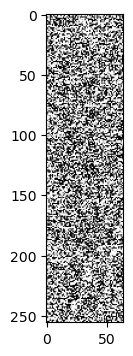

In [235]:
plt.figure(figsize=(1,4))
# plt.imshow(inputs[0,0].cpu().detach().numpy().T, cmap="Greys")
plt.imshow(out[1,0].cpu().detach().numpy().T, cmap="Greys")
# plt.set_axis_off() 

In [ ]:
fig, ax = plt.subplots(1,1, figsize=(16,6))
ax.imshow(canvas, cmap="Greys")
ax.set_aspect('auto')
ax.set_axis_off()
fig.show()

In [62]:
from pathlib import Path
a = Path('./abc')
str(a/'bcd')

'abc/bcd'

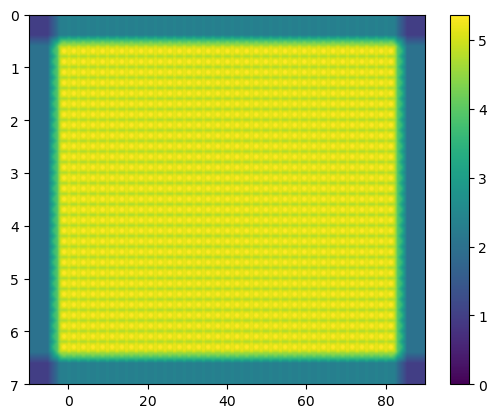

In [374]:
plt.imshow(data(canvas_wt), extent=[-10, 90, 7, 0], aspect='auto', vmin=0)
plt.colorbar()

/var/folders/2r/scd6f2h9659__5_241brfhqh0000gn/T/ipykernel_84726/641269350.py:18: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


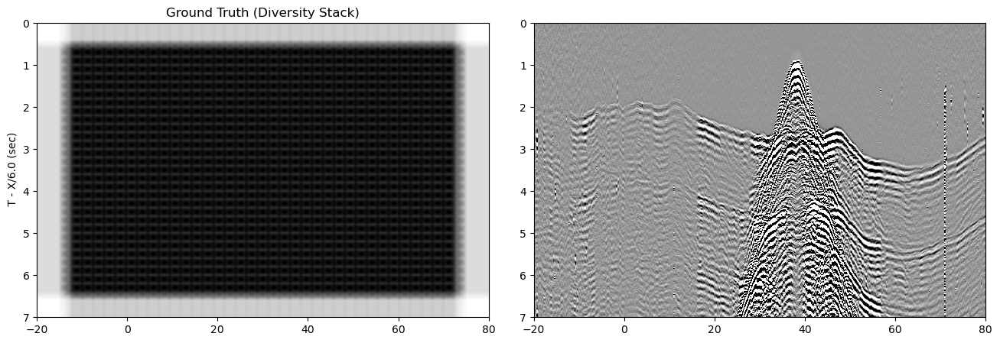

In [361]:
obs_num = 6
xshift = (obs_num-1)*-2
to_flip = False

data = lambda d: np.flip(d, axis=1) if to_flip else d
# fig, axs = plt.subplots(2,2, figsize=(16,10), gridspec_kw={'wspace': 0.1})
fig, axs = plt.subplots(1,2, figsize=(16,5), gridspec_kw={'wspace': 0.1})
axs[0].imshow(data(canvas_inp), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[0].set_aspect('auto')
axs[0].set_axis_on()
axs[0].set_title('Input')
axs[0].set_ylabel(' T - X/6.0 (sec)')
axs[1].imshow(data(canvas_gt), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[1].set_aspect('auto')
axs[1].set_axis_on()
axs[0].set_title('Ground Truth (Diversity Stack)')

fig.show()

/var/folders/2r/scd6f2h9659__5_241brfhqh0000gn/T/ipykernel_84726/2374515644.py:28: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


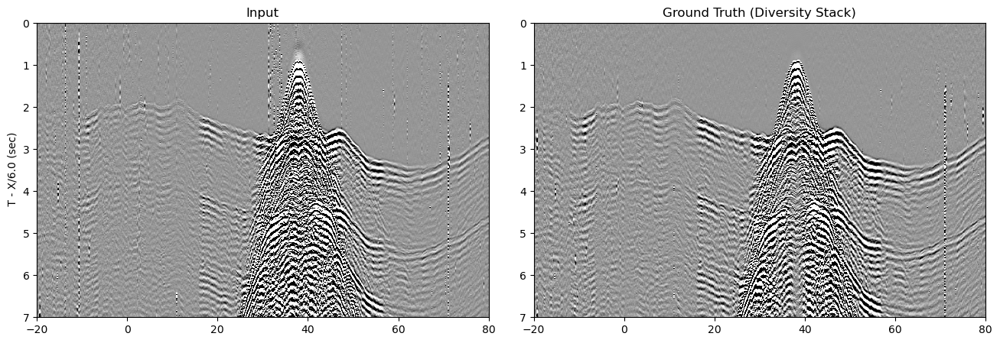

In [60]:
obs_num = 6
xshift = (obs_num-1)*-2
to_flip = False

data = lambda d: np.flip(d, axis=1) if to_flip else d
# fig, axs = plt.subplots(2,2, figsize=(16,10), gridspec_kw={'wspace': 0.1})
fig, axs = plt.subplots(1,2, figsize=(16,5), gridspec_kw={'wspace': 0.1})
axs[0].imshow(data(canvas_inp), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[0].set_aspect('auto')
axs[0].set_axis_on()
axs[0].set_title('Input')
axs[0].set_ylabel(' T - X/6.0 (sec)')
axs[1].imshow(data(canvas_gt), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[1].set_aspect('auto')
axs[1].set_axis_on()
axs[1].set_title('Ground Truth (Diversity Stack)')
# axs[1,0].imshow(data(canvas_inp), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
# axs[1,0].set_aspect('auto')
# axs[1,0].set_axis_on()
# axs[1,0].set_title('Output')
# axs[1,0].set_xlabel('Offset (km)')
# axs[1,0].set_ylabel(' T - X/6.0 (sec)')
# axs[1,1].imshow(data(canvas_inp), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
# axs[1,1].set_aspect('auto')
# axs[1,1].set_axis_on()
# axs[1,1].set_title('Output - Ground Truth')
# axs[1,1].set_xlabel('Offset (km)')
fig.show()

/var/folders/2r/scd6f2h9659__5_241brfhqh0000gn/T/ipykernel_66064/3237440199.py:6: UserWarning: FigureCanvasAgg is non-interactive, and thus cannot be shown
  fig.show()


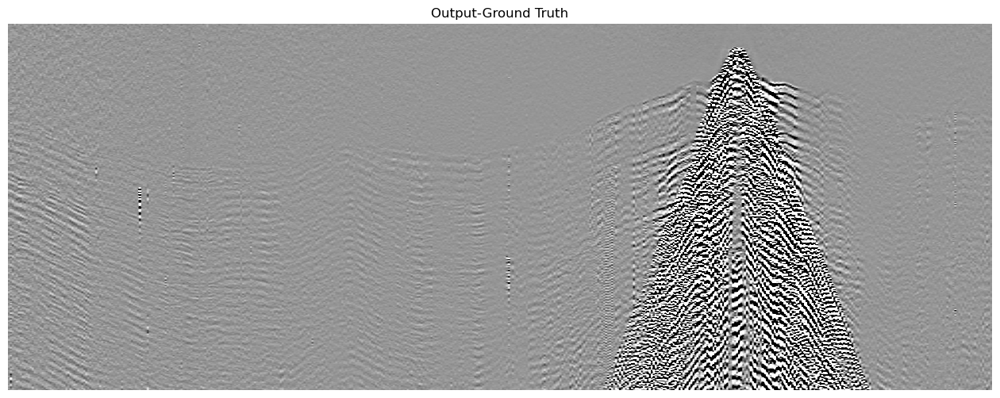

In [148]:
fig, ax = plt.subplots(1,1, figsize=(16,6))
ax.imshow(canvas_out-canvas_gt, cmap="Greys", vmin=-1, vmax=1)
ax.set_aspect('auto')
ax.set_axis_off()
ax.set_title('Output-Ground Truth')
fig.show()

In [228]:
abs(canvas_out[:,200]) > 1

array([False, False, False, ...,  True, False,  True])

In [238]:
int(canvas_out.shape[1]*abs(-10+xshift)/100)
int(canvas_out.shape[1]*abs(90+xshift)/100)
np.argmax(abs(canvas_out[:,int(canvas_out.shape[1]*abs(-10+xshift)/100)]) > 1)
# canvas_out.shape

198

In [268]:
canvas_out.shape[0]

1786

In [287]:
True | 103

103

In [282]:
np.argmax(abs(canvas_out[:,int(canvas_out.shape[1]*abs(90+xshift)/100)]) > 1)
first_arrival(int(canvas_out.shape[1]*abs(90+xshift)/100))
# first_arrival(int(canvas_out.shape[1]*abs(90+xshift)/100))

np.int64(1790)

Text(0.5, 0, 'Offset (km)')

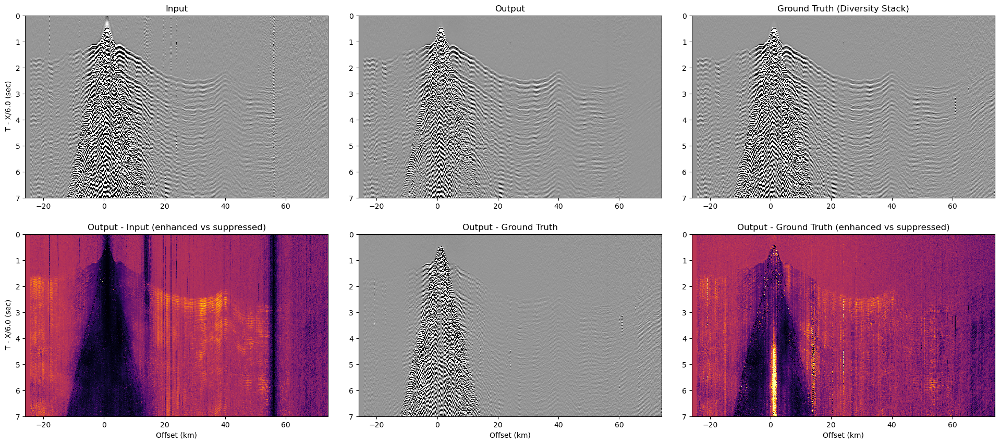

In [214]:
from dataset.demultiple.data_test_npy.tile_info import profile_names
n=28
canvas_inp = np.load(f'results/demultiple0116-waveform/canvas_inp-{n}.npy')
canvas_gt = np.load(f'results/demultiple0116-waveform/canvas_gt-{n}.npy')
canvas_out = np.load(f'results/demultiple0116-waveform/canvas_model-final-{n}.npy')

xshift = (int(profile_names[n//5].rsplit('_',1)[1].rsplit('-',1)[0][1:3])-1)*-2
first_arrival = lambda x: canvas_out.shape[0] if np.argmax(abs(canvas_out[:,x]) > 1) == 0 else np.argmax(abs(canvas_out[:,x]) > 1)
to_flip = first_arrival(int(canvas_out.shape[1]*abs(-10+xshift)/100)) > first_arrival(int(canvas_out.shape[1]*abs(90+xshift)/100))
data = lambda d: np.flip(np.pad(d, ((0,0), (0,8)), mode='constant'), axis=1) if to_flip else np.pad(d, ((0,0), (0,8)), mode='constant')
# data = lambda d: np.flip(d, axis=1) if to_flip else d
fig, axs = plt.subplots(2,3, figsize=(24,10), gridspec_kw={'wspace': 0.1})
axs[0,0].imshow(data(canvas_inp), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[0,0].set_aspect('auto')
axs[0,0].set_axis_on()
axs[0,0].set_title('Input')
# axs[0,1].set_ylabel(' T - X/6.0 (sec)')

axs[0,2].imshow(data(canvas_gt), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[0,2].set_aspect('auto')
axs[0,2].set_axis_on()
axs[0,2].set_title('Ground Truth (Diversity Stack)')

axs[0,1].imshow(data(canvas_out), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[0,1].set_aspect('auto')
axs[0,1].set_axis_on()
axs[0,1].set_title('Output')
axs[0,0].set_ylabel(' T - X/6.0 (sec)')

axs[1,1].imshow(data(canvas_out-canvas_gt), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[1,1].set_aspect('auto')
axs[1,1].set_axis_on()
axs[1,1].set_title('Output - Ground Truth')
axs[1,0].set_ylabel(' T - X/6.0 (sec)')
axs[1,0].set_xlabel('Offset (km)')

axs[1,0].imshow(data((canvas_out-canvas_inp)*(canvas_inp/abs(canvas_inp)/np.maximum(0.25,abs(canvas_inp)))), cmap="inferno", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[1,0].set_aspect('auto')
axs[1,0].set_axis_on()
axs[1,0].set_title('Output - Input (enhanced vs suppressed)')
axs[1,1].set_xlabel('Offset (km)')
# axs[1,1].set_ylabel(' T - X/6.0 (sec)')

axs[1,2].imshow(data((canvas_out-canvas_gt)*(canvas_gt/abs(canvas_gt)/np.maximum(0.25,abs(canvas_gt)))), cmap="inferno", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[1,2].set_aspect('auto')
axs[1,2].set_axis_on()
axs[1,2].set_title('Output - Ground Truth (enhanced vs suppressed)')
axs[1,2].set_xlabel('Offset (km)')


Text(0.5, 0, 'Offset (km)')

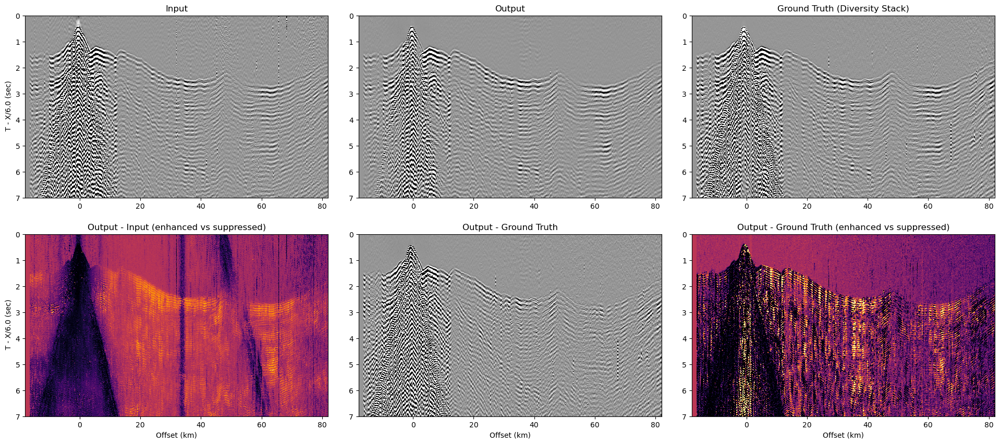

In [37]:
from dataset.demultiple.data_test_npy.tile_info import profile_names
n=0
canvas_inp = np.load(f'results/demultiple0116-waveform/canvas-mcs_dwnsmp_inp-{n}.npy')
canvas_gt = np.load(f'results/demultiple0116-waveform/canvas-mcs_dwnsmp_gt-{n}.npy')
canvas_out = np.load(f'results/demultiple0116-waveform/canvas-mcs_dwnsmp_model-final-{n}.npy')

# xshift = (int(profile_names[n//5].rsplit('_',1)[1].rsplit('-',1)[0][1:3])-1)*-2
xshift = -8
first_arrival = lambda x: canvas_out.shape[0] if np.argmax(abs(canvas_out[:,x]) > 1) == 0 else np.argmax(abs(canvas_out[:,x]) > 1)
# to_flip = first_arrival(int(canvas_out.shape[1]*abs(-10+xshift)/100)) > first_arrival(int(canvas_out.shape[1]*abs(90+xshift)/100))
to_flip = True
data = lambda d: np.flip(np.pad(d, ((0,0), (0,8)), mode='constant'), axis=1) if to_flip else np.pad(d, ((0,0), (0,8)), mode='constant')
# data = lambda d: np.flip(d, axis=1) if to_flip else d
fig, axs = plt.subplots(2,3, figsize=(24,10), gridspec_kw={'wspace': 0.1})
axs[0,0].imshow(data(canvas_inp), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[0,0].set_aspect('auto')
axs[0,0].set_axis_on()
axs[0,0].set_title('Input')
# axs[0,1].set_ylabel(' T - X/6.0 (sec)')

axs[0,2].imshow(data(canvas_gt), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[0,2].set_aspect('auto')
axs[0,2].set_axis_on()
axs[0,2].set_title('Ground Truth (Diversity Stack)')

axs[0,1].imshow(data(canvas_out), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[0,1].set_aspect('auto')
axs[0,1].set_axis_on()
axs[0,1].set_title('Output')
axs[0,0].set_ylabel(' T - X/6.0 (sec)')

axs[1,1].imshow(data(canvas_out-canvas_gt), cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[1,1].set_aspect('auto')
axs[1,1].set_axis_on()
axs[1,1].set_title('Output - Ground Truth')
axs[1,0].set_ylabel(' T - X/6.0 (sec)')
axs[1,0].set_xlabel('Offset (km)')

axs[1,0].imshow(data((canvas_out-canvas_inp)*(canvas_inp/abs(canvas_inp)/np.maximum(0.25,abs(canvas_inp)))), cmap="inferno", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[1,0].set_aspect('auto')
axs[1,0].set_axis_on()
axs[1,0].set_title('Output - Input (enhanced vs suppressed)')
axs[1,1].set_xlabel('Offset (km)')
# axs[1,1].set_ylabel(' T - X/6.0 (sec)')

axs[1,2].imshow(data((canvas_out-canvas_gt)*(canvas_gt/abs(canvas_gt)/np.maximum(0.25,abs(canvas_gt)))), cmap="inferno", extent=[-10+xshift, 90+xshift, 7, 0], vmin=-1, vmax=1)
axs[1,2].set_aspect('auto')
axs[1,2].set_axis_on()
axs[1,2].set_title('Output - Ground Truth (enhanced vs suppressed)')
axs[1,2].set_xlabel('Offset (km)')


Text(0.5, 0, 'Offset (km)')

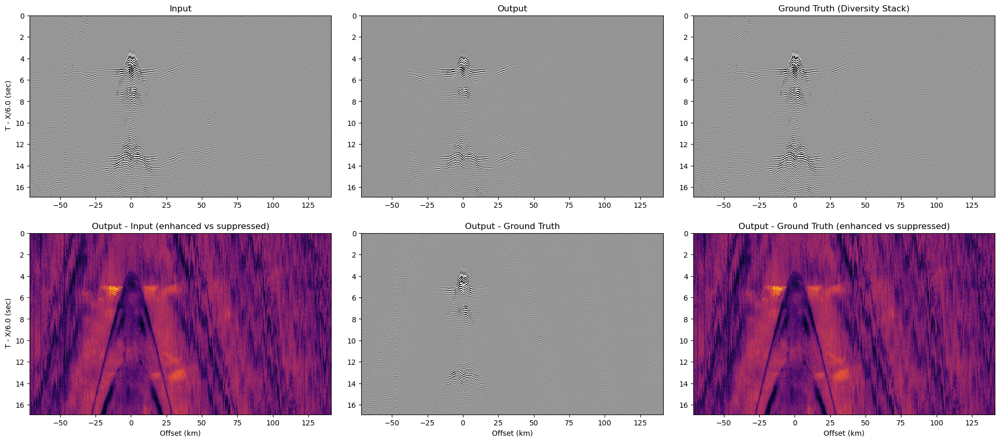

In [225]:
from dataset.demultiple.data_test_npy.tile_info import profile_names
n=0
canvas_inp = np.load(f'results/demultiple0116-waveform/canvas-nwp_upsmp-50m_inp-{n}.npy')
canvas_gt = np.load(f'results/demultiple0116-waveform/canvas-nwp_upsmp-50m_gt-{n}.npy')
canvas_out = np.load(f'results/demultiple0116-waveform/canvas-nwp_upsmp-50m_model-final-{n}.npy')

# xshift = (int(profile_names[n//5].rsplit('_',1)[1].rsplit('-',1)[0][1:3])-1)*-2
xshift = 0
xleft = -71.5+xshift
xright = 141.15+xshift
tbottom = 16.896
ttop = 0
first_arrival = lambda x: canvas_out.shape[0] if np.argmax(abs(canvas_out[:,x]) > 1) == 0 else np.argmax(abs(canvas_out[:,x]) > 1)
# to_flip = first_arrival(int(canvas_out.shape[1]*abs(-10+xshift)/100)) > first_arrival(int(canvas_out.shape[1]*abs(90+xshift)/100))
to_flip = False
# data = lambda d: np.flip(np.pad(d, ((0,0), (0,8)), mode='constant'), axis=1) if to_flip else np.pad(d, ((0,0), (0,8)), mode='constant')
data = lambda d: np.flip(d, axis=1) if to_flip else d
fig, axs = plt.subplots(2,3, figsize=(24,10), gridspec_kw={'wspace': 0.1})
axs[0,0].imshow(data(canvas_inp), cmap="Greys", extent=[xleft, xright, tbottom, ttop], vmin=-1, vmax=1)
axs[0,0].set_aspect('auto')
axs[0,0].set_axis_on()
axs[0,0].set_title('Input')
# axs[0,1].set_ylabel(' T - X/6.0 (sec)')

axs[0,2].imshow(data(canvas_gt), cmap="Greys", extent=[xleft, xright, tbottom, ttop], vmin=-1, vmax=1)
axs[0,2].set_aspect('auto')
axs[0,2].set_axis_on()
axs[0,2].set_title('Ground Truth (Diversity Stack)')

axs[0,1].imshow(data(canvas_out), cmap="Greys", extent=[xleft, xright, tbottom, ttop], vmin=-1, vmax=1)
axs[0,1].set_aspect('auto')
axs[0,1].set_axis_on()
axs[0,1].set_title('Output')
axs[0,0].set_ylabel(' T - X/6.0 (sec)')

axs[1,1].imshow(data(canvas_out-canvas_gt), cmap="Greys", extent=[xleft, xright, tbottom, ttop], vmin=-1, vmax=1)
axs[1,1].set_aspect('auto')
axs[1,1].set_axis_on()
axs[1,1].set_title('Output - Ground Truth')
axs[1,0].set_ylabel(' T - X/6.0 (sec)')
axs[1,0].set_xlabel('Offset (km)')

axs[1,0].imshow(data((canvas_out-canvas_inp)*(canvas_inp/abs(canvas_inp)/np.maximum(0.25,abs(canvas_inp)))), cmap="inferno", extent=[xleft, xright, tbottom, ttop], vmin=-1, vmax=1)
axs[1,0].set_aspect('auto')
axs[1,0].set_axis_on()
axs[1,0].set_title('Output - Input (enhanced vs suppressed)')
axs[1,1].set_xlabel('Offset (km)')
# axs[1,1].set_ylabel(' T - X/6.0 (sec)')

axs[1,2].imshow(data((canvas_out-canvas_gt)*(canvas_gt/abs(canvas_gt)/np.maximum(0.25,abs(canvas_gt)))), cmap="inferno", extent=[xleft, xright, tbottom, ttop], vmin=-1, vmax=1)
axs[1,2].set_aspect('auto')
axs[1,2].set_axis_on()
axs[1,2].set_title('Output - Ground Truth (enhanced vs suppressed)')
axs[1,2].set_xlabel('Offset (km)')


In [429]:
data(canvas_out).shape

(1786, 1048)

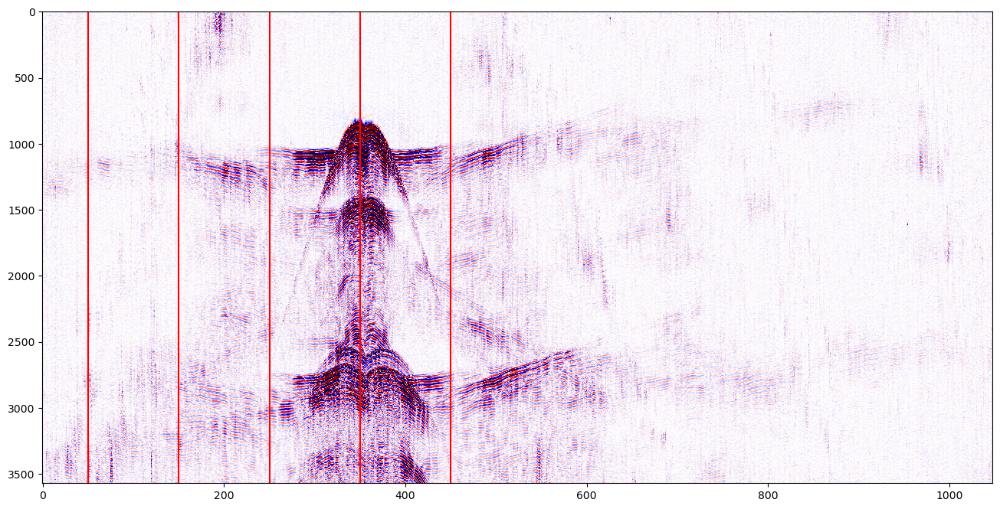

In [241]:
import matplotlib.pyplot as plt
fig, axs = plt.subplots(1, 1, figsize=(16,8), facecolor='w', edgecolor='k',
                       squeeze=False,
                       sharex=True)
# axs[0,0].imshow(data(canvas_out)[:, :], vmin=-1, vmax=1, cmap='grey', alpha=1)
# axs[0,0].imshow(data(canvas_out)[200:1000, 300:800], vmin=-0.0001, vmax=0.0001, cmap='grey', alpha=1)
axs[0,0].imshow(data(canvas_out)[:, :], vmin=-1, vmax=1, cmap='seismic_r')
for i in range(5):
    axs[0,0].axvline(x=i*100+50, color='r', linestyle='-')
    pass
# axs[0,0].imshow(data(canvas_out)[500:2500, 1500:2500], vmin=-1, vmax=1, cmap='grey')
axs[0,0].set_aspect('auto')

In [176]:
from scipy.fftpack import fft, fftfreq
fft(data(canvas_inp)[:,i*100+50])


array([ 0.05913239,  0.05496938,  0.02966204, ...,  0.0192132 ,
       -0.06206175, -0.10611138])

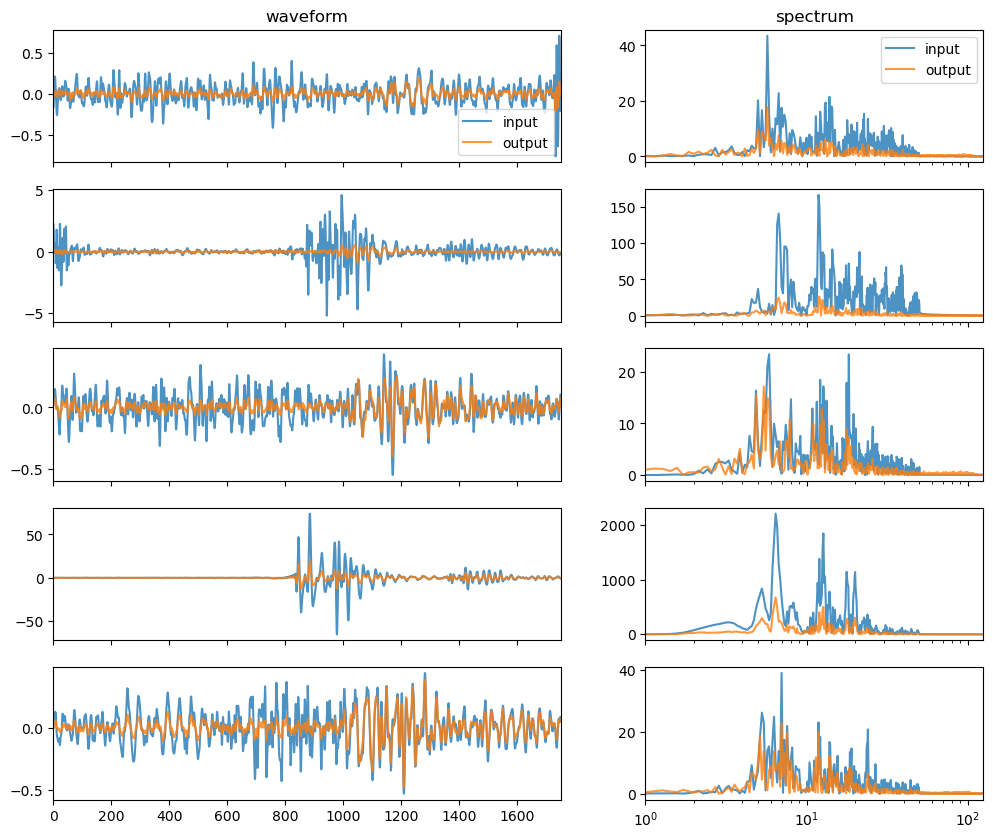

In [37]:
from scipy.fftpack import rfft, rfftfreq
fig, axs = plt.subplots(5,2,figsize=(12,10), gridspec_kw={'width_ratios': [3, 2]})
for i in range(5):
    if not np.array_equal(data(canvas_gt), data(canvas_inp)):
        axs[i,0].plot(data(canvas_gt)[:1750,i*100+50], label='gt', alpha=0.6, color='k')
    axs[i,0].plot(data(canvas_inp)[:1750,i*100+50], label='input', alpha=0.8)
    # plt.plot(canvas_gt[:,99], label='ground truth')
    axs[i,0].plot(data(canvas_out)[:1750,i*100+50], label='output', alpha=0.8)
    axs[i,0].set_xlim(0,1750)
    
    if not np.array_equal(data(canvas_gt), data(canvas_inp)):
        axs[i,1].semilogx(rfftfreq(data(canvas_gt)[:1750,i*100+50].size, d=1/250)[::2], np.abs(rfft(data(canvas_gt)[:1750,i*100+50]))[::2], label='gt', alpha=0.6, color='k')
    axs[i,1].semilogx(rfftfreq(data(canvas_inp)[:1750,i*100+50].size, d=1/250)[::2], np.abs(rfft(data(canvas_inp)[:1750,i*100+50]))[::2], label='input', alpha=0.8)
    axs[i,1].semilogx(rfftfreq(data(canvas_out)[:1750,i*100+50].size, d=1/250)[::2], np.abs(rfft(data(canvas_out)[:1750,i*100+50]))[::2], label='output', alpha=0.8)
    axs[i,1].set_xlim(1,125)
    if i==0:
        axs[i,0].set_title('waveform')
        axs[i,1].set_title('spectrum')
    if i<4:
        axs[i,0].set_xticklabels('')
        axs[i,1].set_xticklabels('')
axs[0,0].legend()
axs[0,1].legend()
# axs[4].set_axis_on()

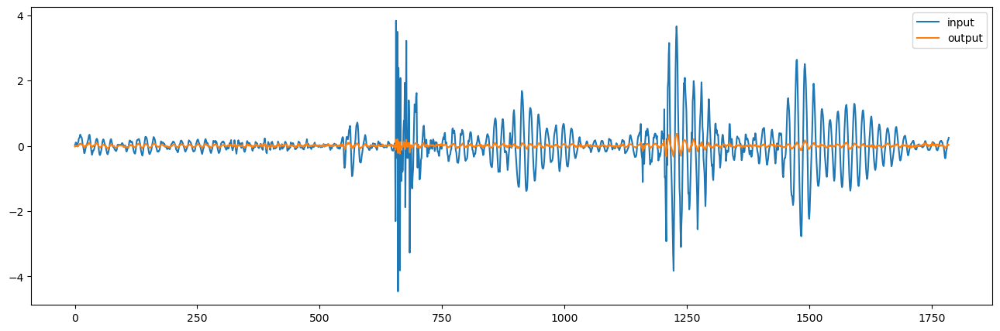

In [501]:
plt.figure(figsize=(16,5))
plt.plot(data(canvas_inp)[:,500], label='input')
# plt.plot(canvas_gt[:,99], label='ground truth')
plt.plot(data(canvas_out)[:,500], label='output')
plt.legend()

In [ ]:
from pathlib import Path
a = Path('./abc')
str(a/'bcd')

'abc/bcd'

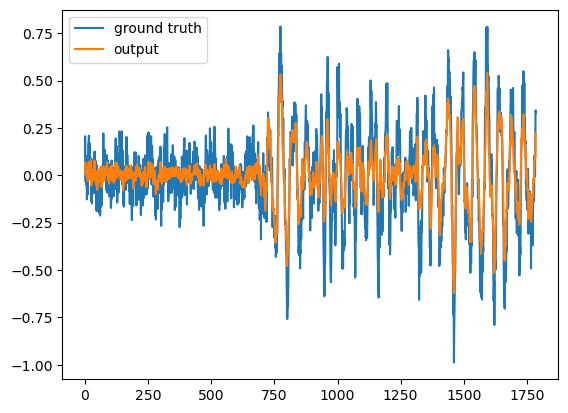

In [257]:
# plt.plot(canvas_inp[:,200], label='input')
plt.plot(canvas_gt[:,99], label='ground truth')
plt.plot(canvas_out[:,99], label='output')
plt.legend()

In [33]:
diff_2k = data(canvas_out-canvas_gt)

In [36]:
print(np.std(diff_1k), np.std(diff_2k))

0.2023194607544309 0.19333250773744548


Text(0.5, 0, 'Offset (km)')

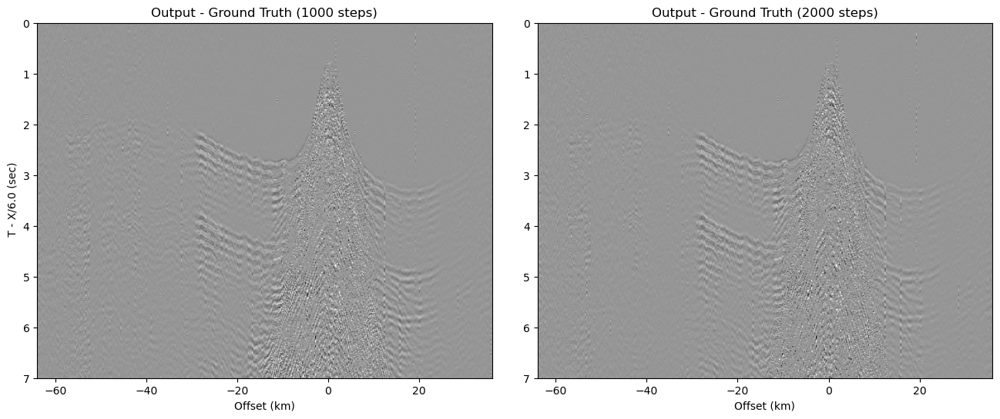

In [43]:
data = lambda d: np.flip(d, axis=1) if to_flip else d
fig, axs = plt.subplots(1,2, figsize=(16,6), gridspec_kw={'wspace': 0.1})
axs[0].imshow(diff_1k, cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0])
axs[0].set_aspect('auto')
axs[0].set_axis_on()
axs[0].set_title('Output - Ground Truth (1000 steps)')
axs[0].set_ylabel(' T - X/6.0 (sec)')
axs[0].set_xlabel('Offset (km)')

axs[1].imshow(diff_2k, cmap="Greys", extent=[-10+xshift, 90+xshift, 7, 0])
axs[1].set_aspect('auto')
axs[1].set_axis_on()
axs[1].set_title('Output - Ground Truth (2000 steps)')
axs[1].set_xlabel('Offset (km)')